# Introduction

Welcome! 



In [21]:
# matplotlib retina display
%config InlineBackend.figure_format='retina'


# Correlation in signals

Find 1 signal that contains recurring patterns. Then use auto-correlation to analyze the recurring patterns within your signal. Can the periodicity of your pattern be visualized via auto-correlogram? Discuss your choice of method and parameters as well as the results in approx. 150 words.
Now cut out a piece of your signal and try to find it in the original signal using cross-correlation. How do you recognize that the position fits? Describe it in 1-2 sentences. Now change your cut-out piece slightly and see if it can still be found via cross-correlation. What types of changes are tolerated? Which ones are not? Discuss the results in approx. 150 words.

Attention: this is an open task. Set your own limits or come to the consultation if you are not clear about the limits. Apt choice of data, to-the-point creativity, moderate diversity and critical thinking are required.


## Exercise Aufgabenstellung #todo

## Dataset

### ECG-ID Database
For the first exercise the ECG-ID database is used. The database contains 100 ECG signals from 100 different people. Each signal is 10 seconds long and has a sampling rate of 1000 Hz. The signals are stored in binary format. 

source: https://physionet.org/content/ecgiddb/1.0.0/

This dataset was chosen because cross-correlation is often used in ECG signal processing. For example, it can be used to detect the QRS complex in an ECG signal. 


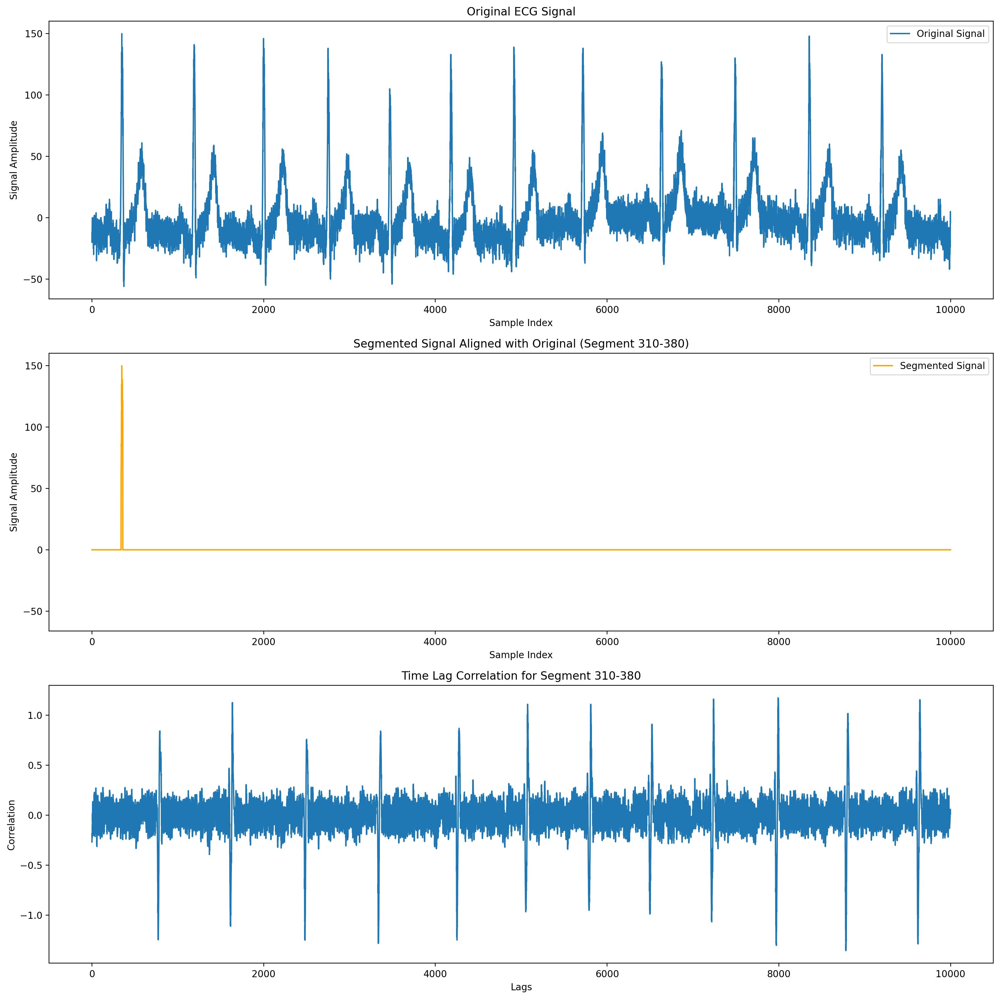

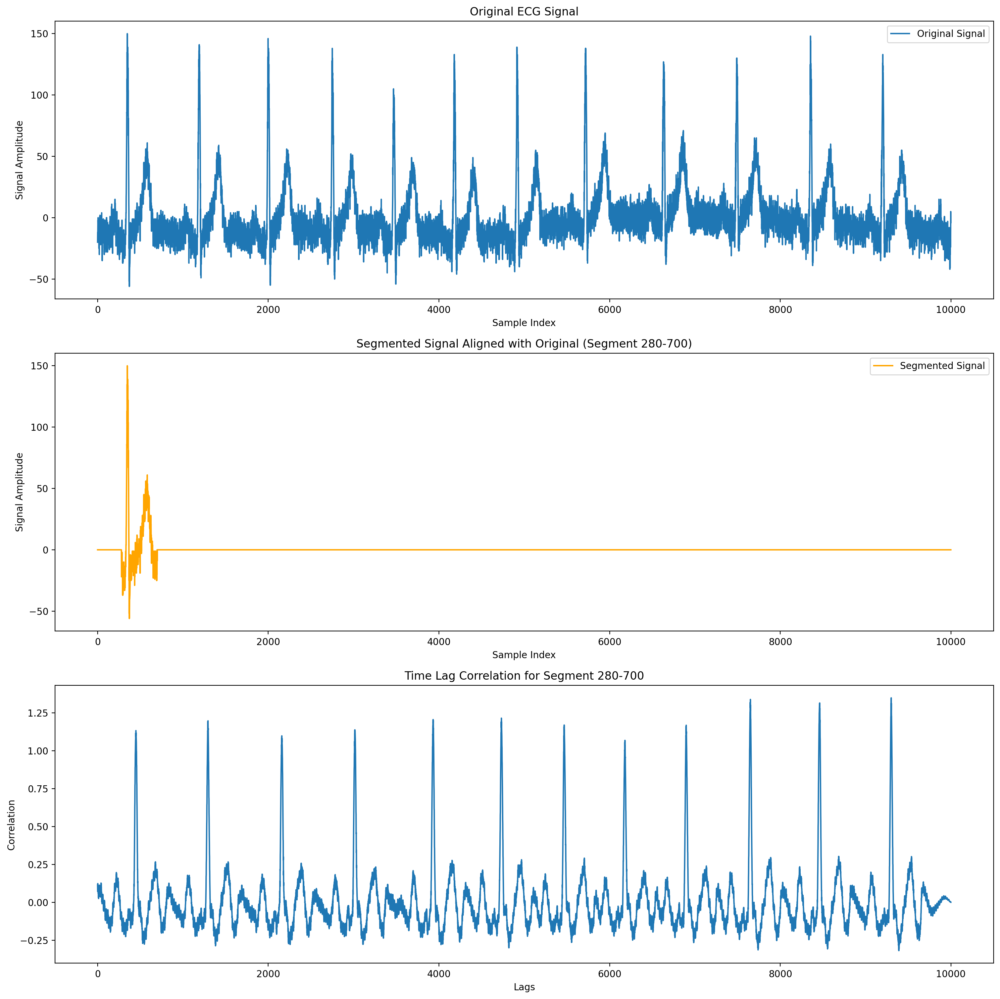

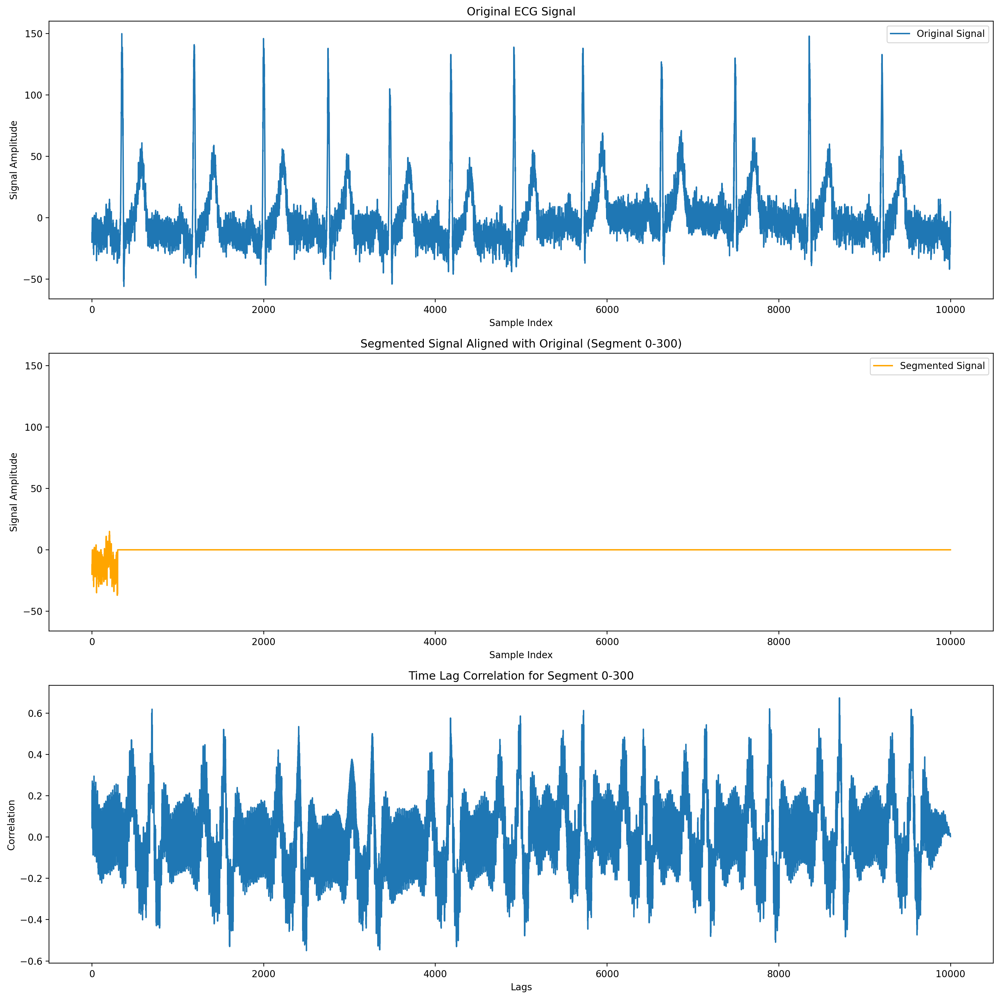

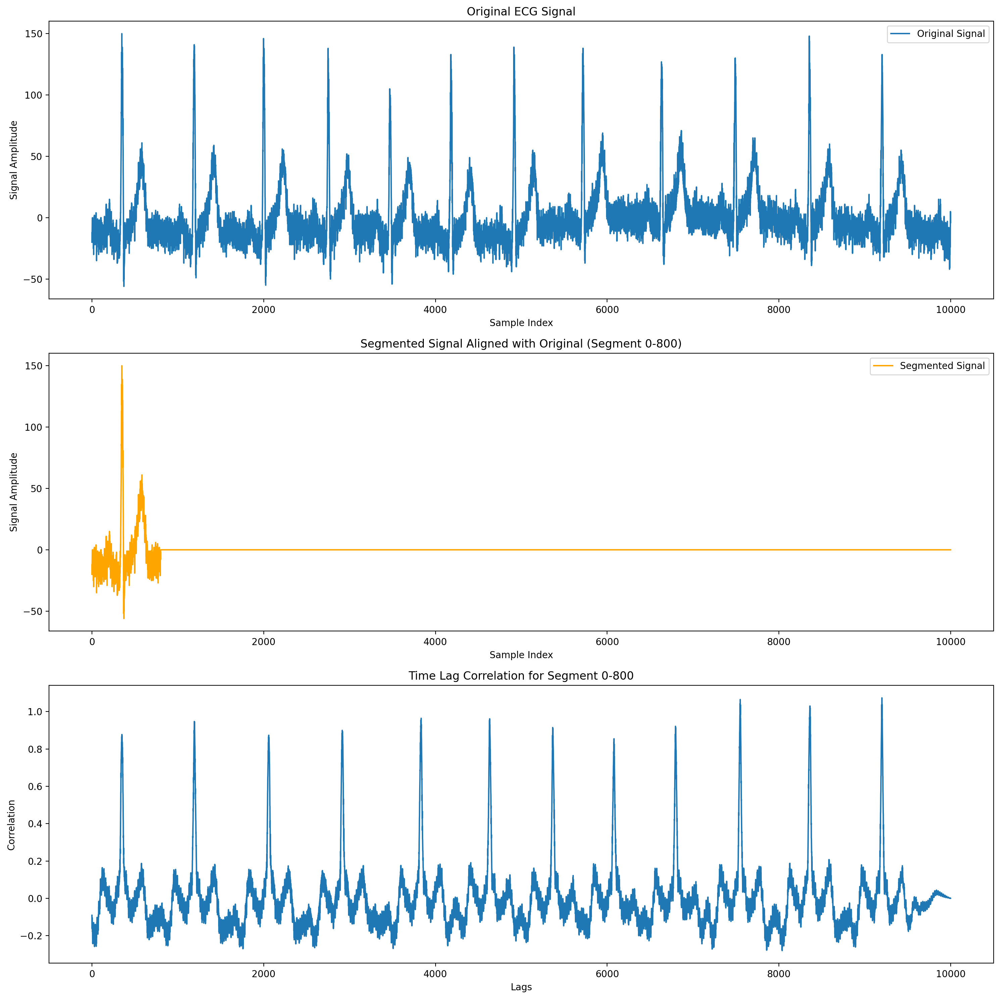

In [53]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import correlate
from skimage.measure import regionprops, label
from statsmodels.tsa.stattools import ccf


# Function to read binary ECG signal data
def read_binary_ecg_signal(file_path, num_samples, data_format='int16'):
    with open(file_path, 'rb') as file:
        signal = np.fromfile(file, dtype=data_format, count=num_samples)
    return signal


# Reading the ECG signal (adjust the file path and format as necessary)
ecg_file_path = 'data/ecg-id-database-1.0.0/Person_01/rec_2.dat'  # Update this path as needed
num_samples = 10000  # Adjust as needed based on the data specifics
ecg_signal = read_binary_ecg_signal(ecg_file_path, num_samples)


# Function to perform time lag cross-correlation
def perform_time_lag_cross_correlation(signal, segment):
    # Time Lag Correlation (ccf)
    ccf_correlation = ccf(segment, signal, adjusted=False)
    lags_ccf = np.arange(len(ccf_correlation))
    return lags_ccf, ccf_correlation

def plot_segment_and_time_lag_correlation(ecg_signal, segment, segment_start, title_suffix):
    segment_end = segment_start + len(segment)
    full_length_segment = np.zeros_like(ecg_signal)
    full_length_segment[segment_start:segment_end] = segment

    # Creating a figure with three subplots
    fig, axs = plt.subplots(3, 1, figsize=(15, 15))

    # Plotting the original ECG signal
    axs[0].plot(ecg_signal, label='Original Signal')
    axs[0].set_title("Original ECG Signal")
    axs[0].set_xlabel("Sample Index")
    axs[0].set_ylabel("Signal Amplitude")
    axs[0].legend()

    # Store the y-axis limits of the original signal plot
    y_limits = axs[0].get_ylim()

    # Plotting the segmented signal aligned with the original signal
    axs[1].plot(full_length_segment, label='Segmented Signal', color='orange')
    axs[1].set_title(f"Segmented Signal Aligned with Original (Segment {title_suffix})")
    axs[1].set_xlabel("Sample Index")
    axs[1].set_ylabel("Signal Amplitude")
    axs[1].legend()
    # Setting the y-axis limits to be the same as the original signal plot
    axs[1].set_ylim(y_limits)

    # Performing time lag cross-correlation
    lags_ccf, ccf_correlation = perform_time_lag_cross_correlation(ecg_signal, segment)

    # Plotting time lag correlation
    axs[2].plot(lags_ccf, ccf_correlation)
    axs[2].set_title(f'Time Lag Correlation for Segment {title_suffix}')
    axs[2].set_xlabel('Lags')
    axs[2].set_ylabel('Correlation')

    plt.tight_layout()
    plt.show()



def add_noise(segment, noise_level):
    noise = np.random.normal(0, noise_level, segment.shape)
    return segment + noise

def scale_amplitude(segment, scale_factor):
    return segment * scale_factor

def time_shift(segment, shift):
    return np.roll(segment, shift)

def invert_signal(segment):
    return -segment

# Example Usage with modified function
segment_310_380 = ecg_signal[340:360]
segment_280_700 = ecg_signal[280:700]
segment_0_300 = ecg_signal[0:300]
segment_0_800 = ecg_signal[0:800]

# Updated function calls
plot_segment_and_time_lag_correlation(ecg_signal, segment_310_380, 340, "310-380")
plot_segment_and_time_lag_correlation(ecg_signal, segment_280_700, 280, "280-700")
plot_segment_and_time_lag_correlation(ecg_signal, segment_0_300, 0, "0-300")
plot_segment_and_time_lag_correlation(ecg_signal, segment_0_800, 0, "0-800")

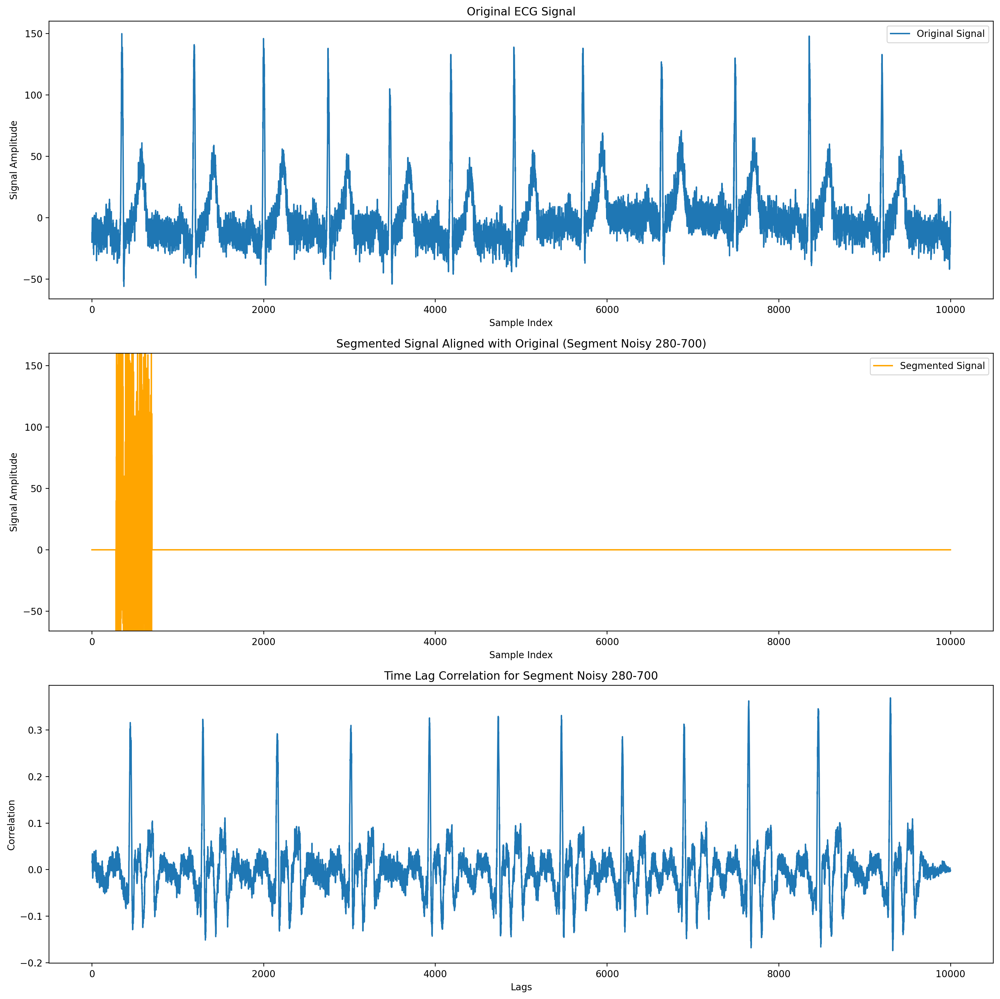

In [66]:
# Extracting a segment and adding noise
noisy_segment = add_noise(segment_280_700, noise_level=30)

# Plotting the original and noisy segments
plot_segment_and_time_lag_correlation(ecg_signal, noisy_segment, 280, "Noisy 280-700")


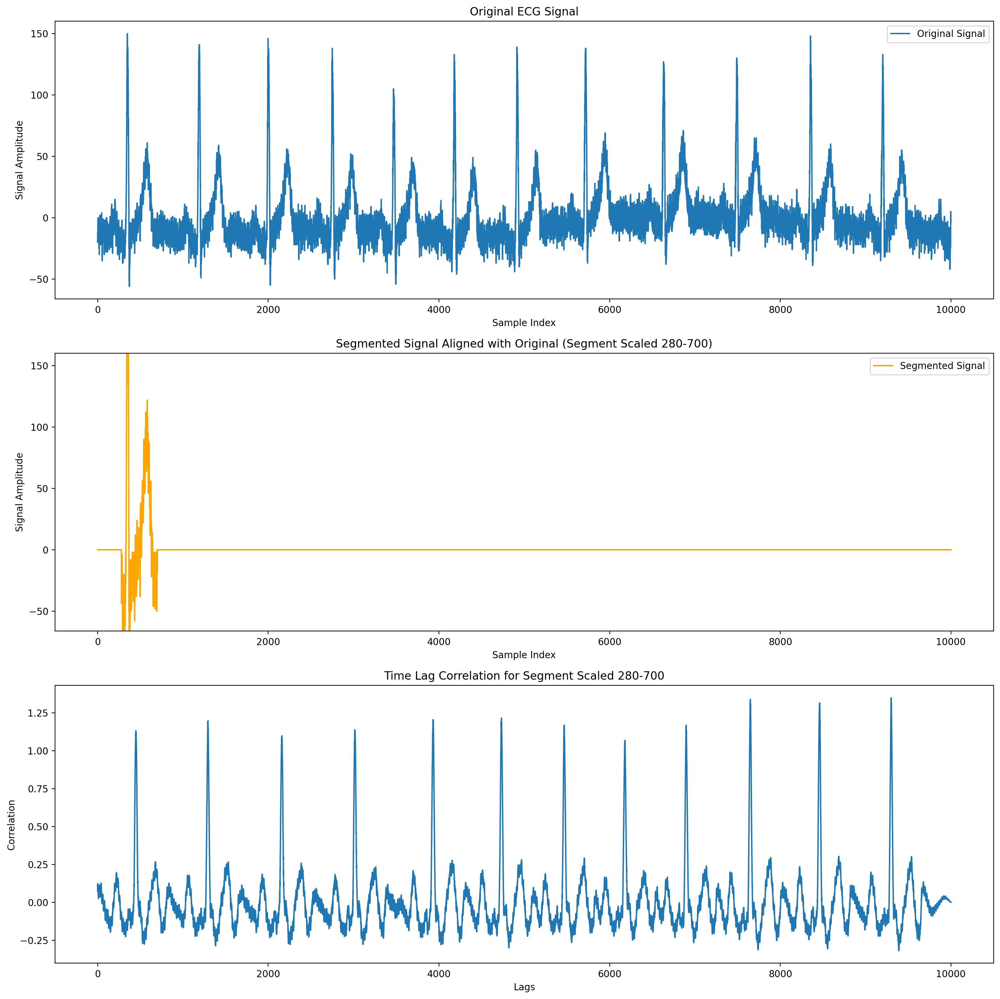

In [63]:
# Extracting a segment and adding scaling
scaled_segment = scale_amplitude(segment_280_700, scale_factor=2)

# Plotting the original and noisy segments
plot_segment_and_time_lag_correlation(ecg_signal, scaled_segment, 280, "Scaled 280-700")


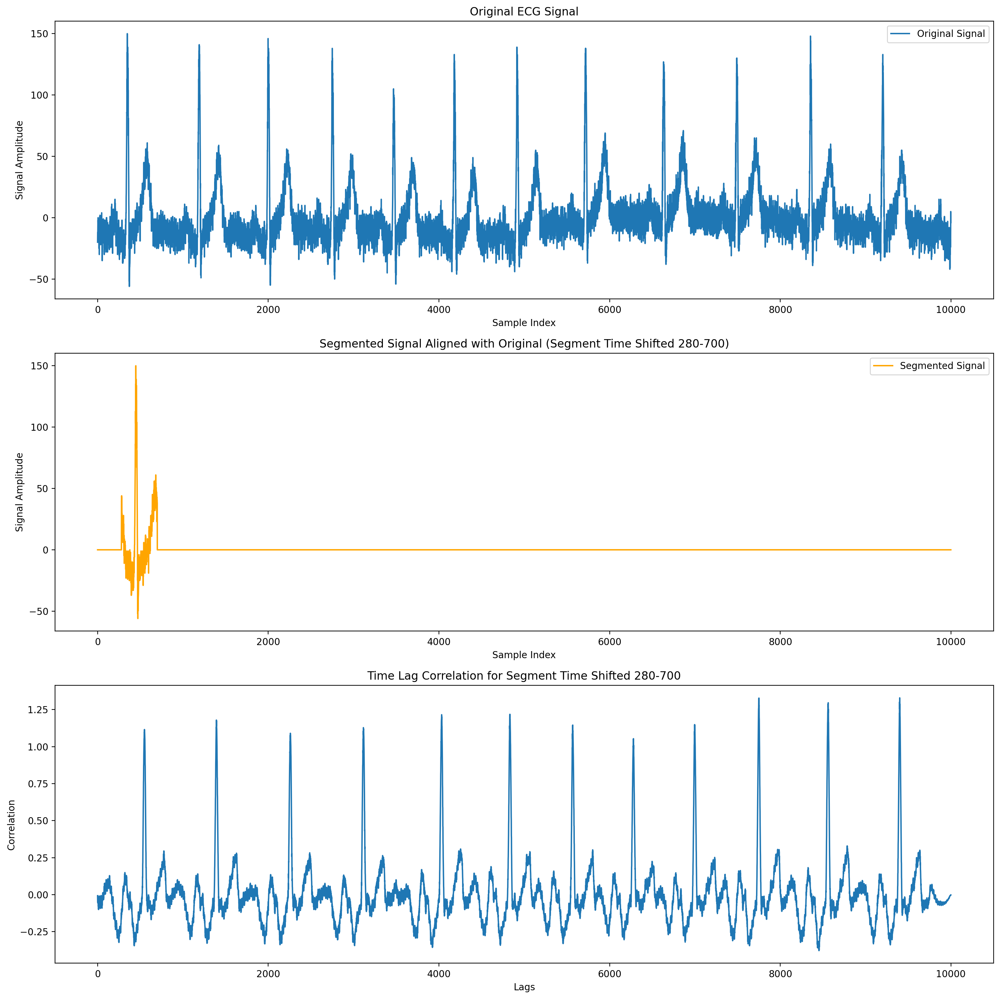

In [64]:
# Extracting a segment and adding time shift
shifted_segment = time_shift(segment_280_700, shift=100)

plot_segment_and_time_lag_correlation(ecg_signal, shifted_segment, 280, "Time Shifted 280-700")

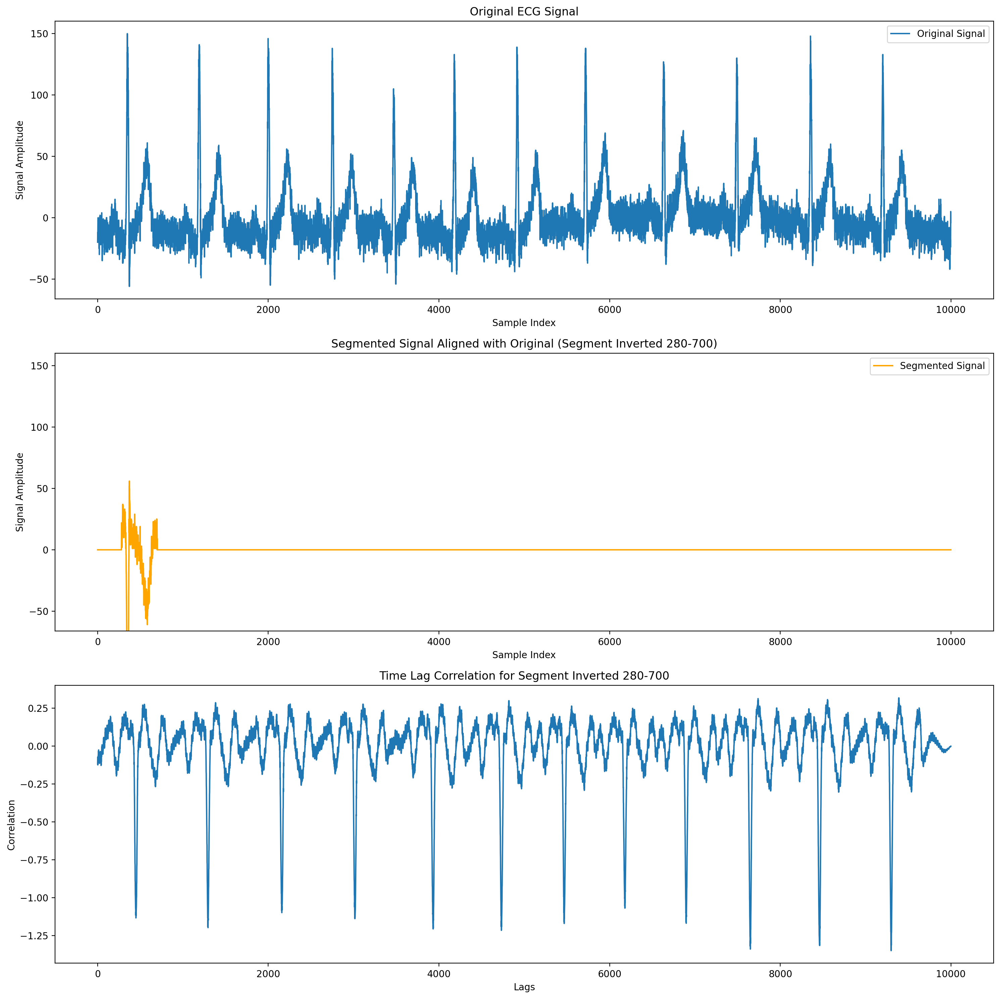

In [65]:
# Extracting a segment and inverting
inverted_segment = invert_signal(segment_280_700)

plot_segment_and_time_lag_correlation(ecg_signal, inverted_segment, 280, "Inverted 280-700")

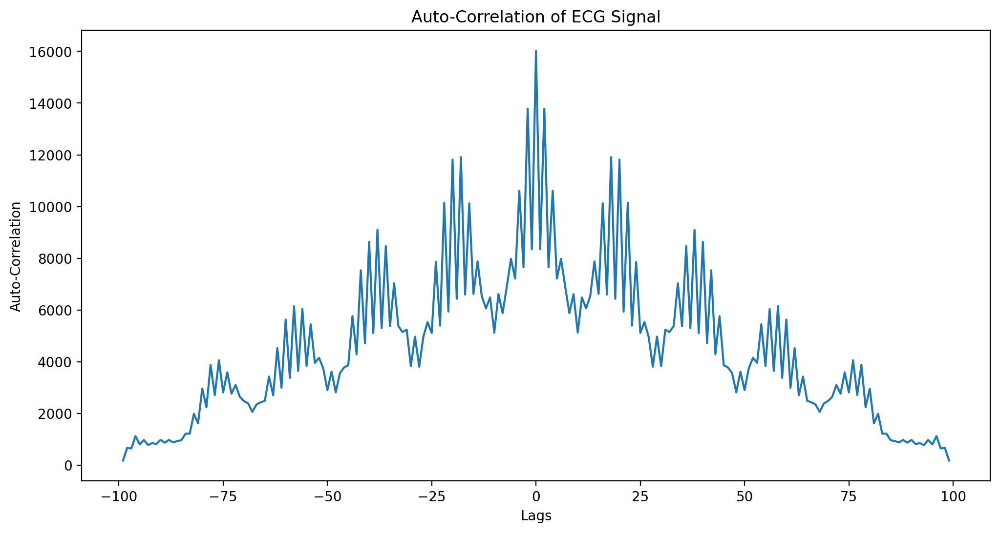

In [26]:
# Auto-correlation of the ECG signal
sub_sample = 150
auto_corr = correlate(ecg_signal[:sub_sample], ecg_signal[:sub_sample])
lags_auto_corr = np.arange(-sub_sample+1, sub_sample)

# fixme smoothe, smaller segments
# Plotting auto-correlation
plt.figure(figsize=(12, 6))
plt.plot(lags_auto_corr, auto_corr)
plt.title('Auto-Correlation of ECG Signal')
plt.xlabel('Lags')
plt.ylabel('Auto-Correlation')
plt.show()


###### todo understand how to interpret the plot



## Segmentation, morphological operations, object properties in images
Find 1 image that contains several similar objects. These objects are to be segmented using suitable methods. The results are to be saved as labeled images (binary or 1 label per class). Show how you have improved the label masks using morphological operations. For each operation used, explain in 1-2 sentences why you are using this operation. Also show the intermediate results of your applied operations in individual images and that you have only changed the objects minimally (e.g. no shifts, reductions or enlargements). At the end, extract your individual objects, count and measure 2-3 properties of your extracted objects using suitable methods. Explain in 1-2 sentences for each property why you chose it and whether the results are useful.  

Then create a skeleton of one of your objects that is as minimal but representative as possible and output the number of pixels of the skeleton.

Discuss your findings and results in approx. 150 words.



### Aerial city view
For the second exercise a picture of an aerial view of a city (Qingdao, Shandong, China) is used, shot by Clark Ma on a DJI, FC3582. The picture was taken from a drone and shows a city with many houses all with red rooftops. The picture is stored in png format. 

source: https://unsplash.com/photos/an-aerial-view-of-a-city-with-red-roofs-LUq0rbuUk6o

This picture was chosen because it contains many similar objects (houses with red rooftops) which is ideal for segmentation. This type of segmentation is also used in satellite imagery, which makes this image a good example for this exercise. 


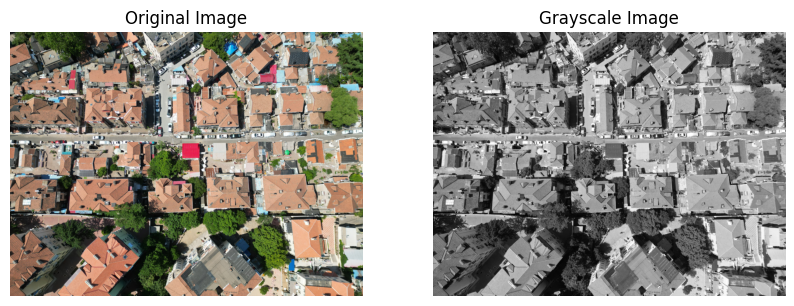

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, exposure, morphology, measure
from skimage.segmentation import clear_border
import cv2

# Load the image
original_image = io.imread('data/Roofs_Satellite.jpg')

gray_image = cv2.cvtColor(original_image, cv2.COLOR_RGB2GRAY)

# Display the original and grayscale images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(original_image)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(gray_image, cmap='gray')
plt.title('Grayscale Image')
plt.axis('off')

plt.show()



# Introduction and Overview
In urban planning and geographical analysis, accurately segmenting rooftops from aerial images is vital. This segmentation assists in understanding urban density, building structures, and applications like solar panel placement. However, accurately identifying rooftops, which vary in color and size and can blend with their surroundings, poses a challenge. Our task is to effectively isolate these rooftops using image processing techniques.

We will work with an image capturing an aerial view of a region, focusing on identifying rooftops. The challenge is to accurately segment these rooftops, despite their varied colors and complex backgrounds, from the rest of the image. Our goal is to refine the segmentation so each rooftop is distinctly isolated, clearly differentiating the buildings from their surroundings.

# Approach

## Objective
The primary objective of this exercise is to segment rooftops from an aerial image. This involves identifying and isolating rooftops using color-based segmentation techniques, refining the segmentation with morphological operations, and analyzing the properties of the extracted objects.

## Methodology
Our approach includes the following steps:

1. **Color-Based Segmentation in HSV Color Space**: Using the HSV color model to differentiate rooftops based on their unique color hues.
2. **Morphological Operations**: Applying techniques such as opening, closing, filling holes, and removing small objects to refine the segmentation.
3. **Labeling and Analyzing Rooftop Properties**: Measuring various properties of the segmented rooftops, such as area, to understand their characteristics.
4. **Skeletonization**: Creating a minimal representation of a selected rooftop for structural analysis.

Each step enhances the accuracy of rooftop segmentation, ensuring a clear distinction between rooftops and their environment.

## Metrics and Visualization
We will visually inspect the results at each significant step to assess the effectiveness of our techniques. This inspection includes:

- Examining the results of color-based segmentation.
- Assessing the impact of each morphological operation.
- Analyzing the properties of segmented rooftops.
- Evaluating the skeletonized representation for minimalism and structural clarity.

Through these visualizations and analyses, we aim to demonstrate the effectiveness of our methods in isolating rooftops from the aerial image.


# Color-based Segmentation in HSV Color Space
The HSV color space effectively separates color (hue) from brightness (value), aiding in isolating specific colors. Here, we segment rooftops by targeting red and brown hues, common colors for rooftops in satellite imagery. This initial step is crucial as it forms the foundation for our subsequent rooftop isolation.

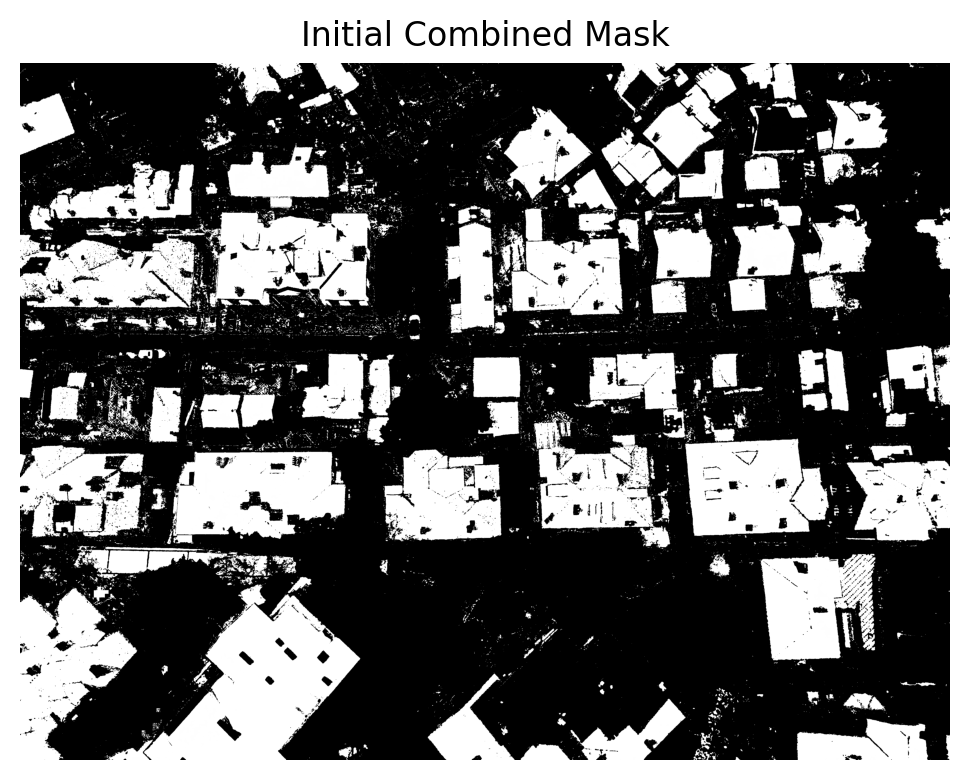

In [51]:
from skimage.morphology import remove_small_objects, dilation
from scipy.ndimage import binary_fill_holes
import matplotlib.pyplot as plt
from skimage.morphology import closing, opening, square, skeletonize
from skimage.measure import label, regionprops
import cv2
import numpy as np

# Convert to HSV color space
hsv_image = cv2.cvtColor(original_image, cv2.COLOR_RGB2HSV)

# Define color ranges for red and brown
lower_red1 = np.array([0, 50, 20])
upper_red1 = np.array([10, 255, 255])
lower_brown = np.array([10, 50, 20])
upper_brown = np.array([15, 255, 255])
lower_red2 = np.array([160, 50, 20])
upper_red2 = np.array([180, 255, 255])

lower_gray_like = np.array([0, 0, 53])
upper_gray_like = np.array([10, 50, 160])

mask1 = cv2.inRange(hsv_image, lower_red1, upper_red1)
mask2 = cv2.inRange(hsv_image, lower_brown, upper_brown)
mask3 = cv2.inRange(hsv_image, lower_red2, upper_red2)
mask4 = cv2.inRange(hsv_image, lower_gray_like, upper_gray_like)

# Combine masks to capture red and brown shades
combined_mask = mask1 + mask2 + mask3 + mask4

# Plot the initial combined mask
plt.figure(figsize=(6, 6))
plt.imshow(combined_mask, cmap='gray')
plt.title('Initial Combined Mask')
plt.axis('off')
plt.show()


# Morphological Opening to Refine the Mask
Morphological opening (erosion followed by dilation) is applied to smooth the edges of larger objects and remove small noise. This refinement is vital as it enhances the quality of our segmentation, focusing on significant objects while reducing the impact of small artifacts.


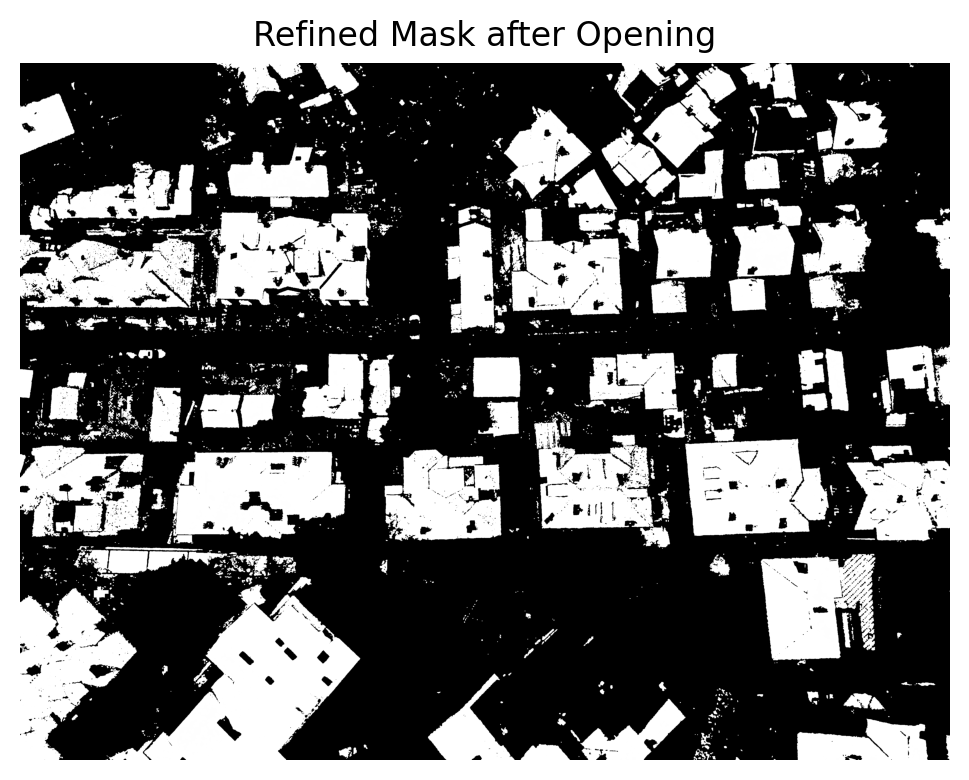

In [49]:
# Perform morphological operations to refine the mask
kernel = np.ones((3, 3), np.uint8)
refined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_OPEN, kernel)

# Plot the refined mask
plt.figure(figsize=(6, 6))
plt.imshow(refined_mask, cmap='gray')
plt.title('Refined Mask after Opening')
plt.axis('off')
plt.show()

# Filling Holes 
After opening, small holes in the mask can lead to incomplete rooftop shapes. Using binary_fill_holes fills these gaps, ensuring complete rooftop shapes. 


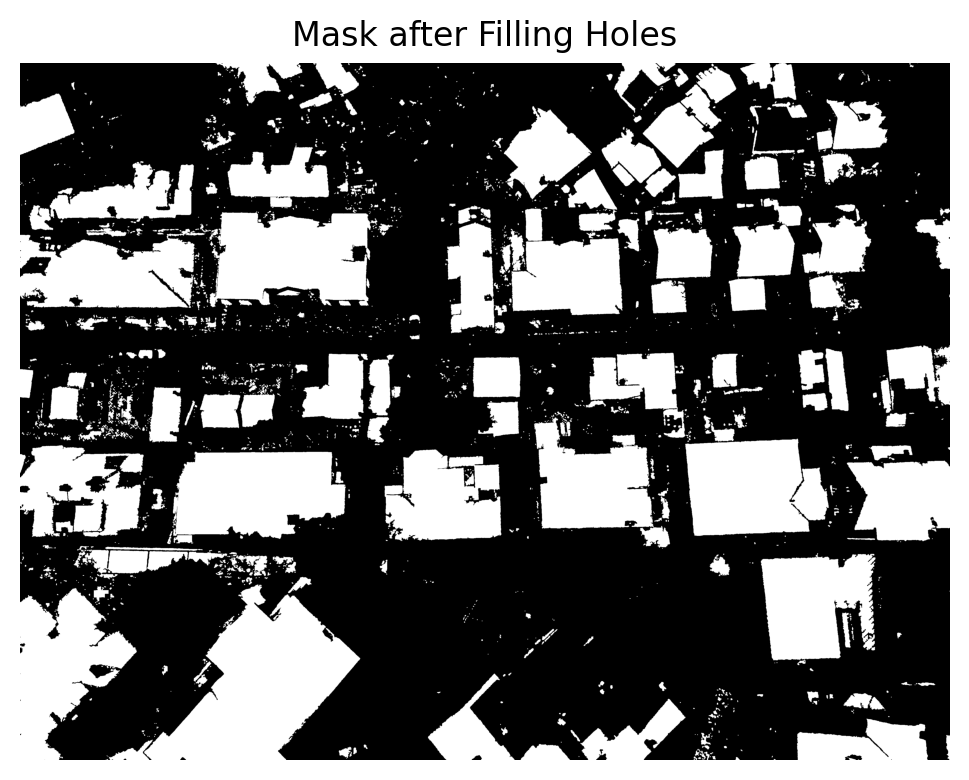

In [50]:
# Fill holes using binary_fill_holes
filled_mask = binary_fill_holes(refined_mask).astype(np.uint8)

# plot the filled mask
plt.figure(figsize=(6, 6))
plt.imshow(filled_mask, cmap='gray')
plt.title('Mask after Filling Holes')
plt.axis('off')
plt.show()



# Removing Small Objects
Following this we ccan see that the roofs are clean but there is still a lot of fragmented noise in the image. We can remove this noise by removing small objects from the mask. This is done by using the remove_small_objects function from scikit-image. This function removes all connected components (objects) smaller than the specified size.

Objects before filling holes: 23412
Objects after all cleaning operations: 68


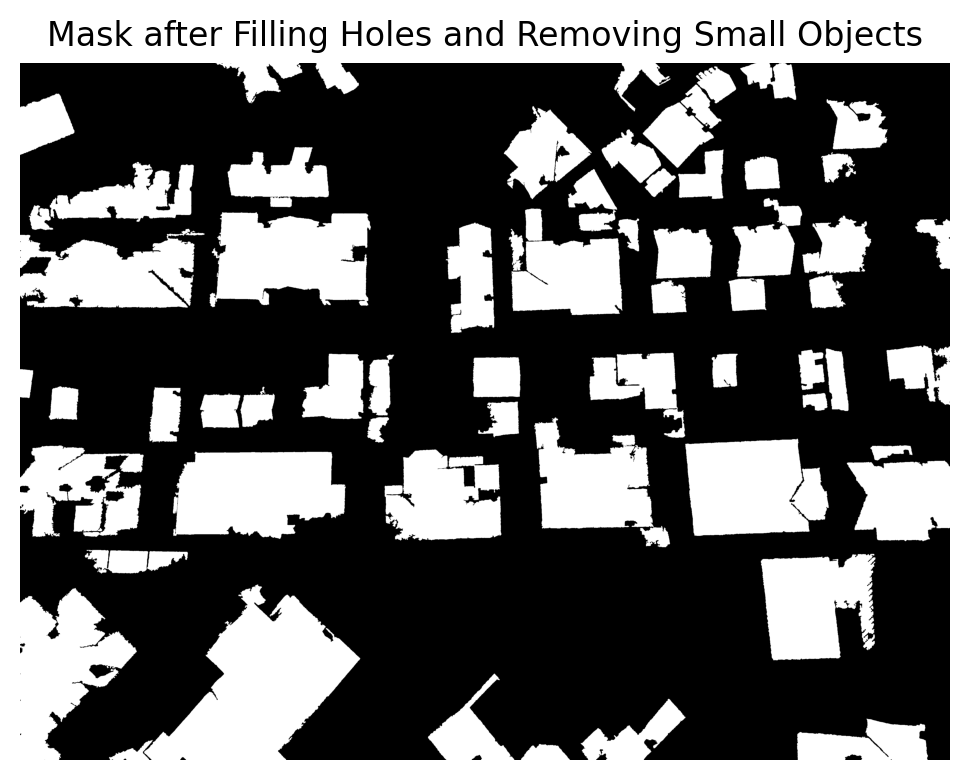

In [36]:
# Remove small objects from the filled mask
min_size = 6000
cleaned_mask_bool = remove_small_objects(filled_mask > 0, min_size=min_size)

# Convert boolean mask back to uint8 for visualization and further processing
cleaned_mask = (cleaned_mask_bool * 255).astype(np.uint8)

# Label and analyze properties of the closed mask
labeled_mask = label(cleaned_mask)
properties = regionprops(labeled_mask)


# Count of objects before and after filling holes
objects_before_filling = np.max(label(refined_mask))
objects_after_cleaning = len(properties)
print(f"Objects before filling holes: {objects_before_filling}")
print(f"Objects after all cleaning operations: {objects_after_cleaning}")

# Plot the mask after filling holes and removing small objects
plt.figure(figsize=(6, 6))
plt.imshow(cleaned_mask, cmap='gray')
plt.title('Mask after Removing Small Objects')
plt.axis('off')
plt.show()

# Closing Operation to Refine Mask
After all of this our segmentation is already in a good state. We were able to get the number of objects from 23412 to 84. However, we can further refine it by applying a closing operation.

Closing (dilation followed by erosion) further refines our mask. It's essential for closing any small holes or gaps within the rooftops, ensuring that the rooftops are represented as solid, contiguous shapes. This is just to ensure that the labels in the end are not split up (e.g. if there is a small gap between two rooftops, they should still be labeled as one object ideally).

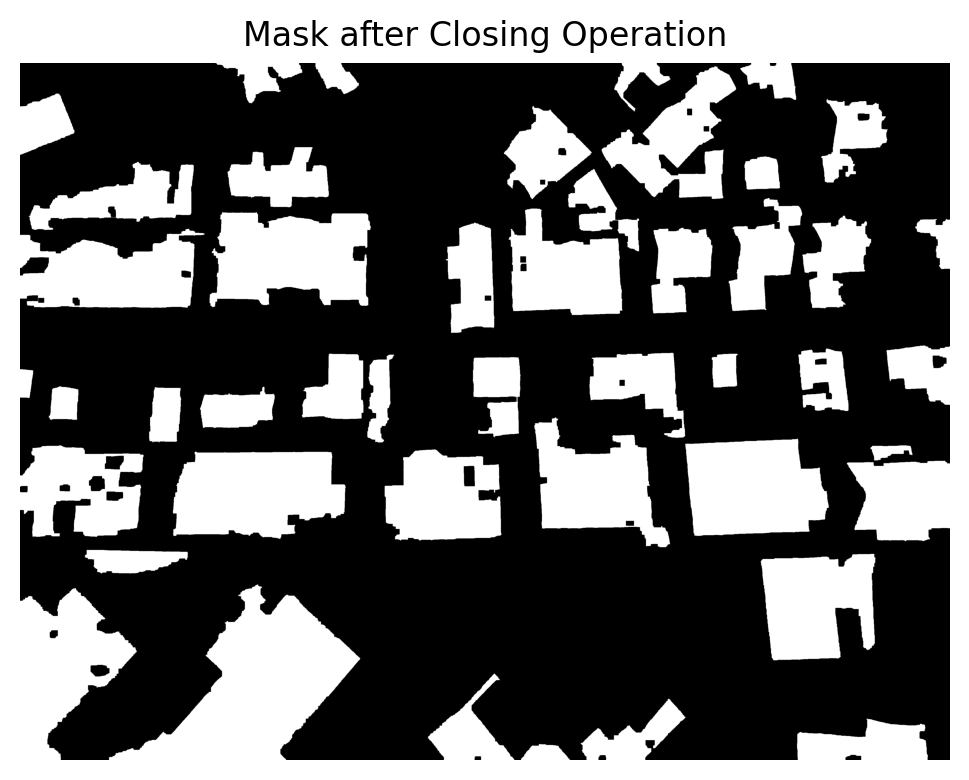

In [37]:
# Close small holes on the roofs with a larger kernel
large_kernel = np.ones((5, 5), np.uint8)
closed_mask = cv2.morphologyEx(cleaned_mask, cv2.MORPH_CLOSE, large_kernel, iterations=5)

# Plot the mask after the closing operation
plt.figure(figsize=(6, 6))
plt.imshow(closed_mask, cmap='gray')
plt.title('Mask after Closing Operation')
plt.axis('off')
plt.show()



# Fill Holes Again
After the closing operation, we can see that the rooftops are now solid shapes. However, there are still some small holes in the rooftops. We can fill these holes again using the binary_fill_holes function from scikit-image.

Count of objects: 46


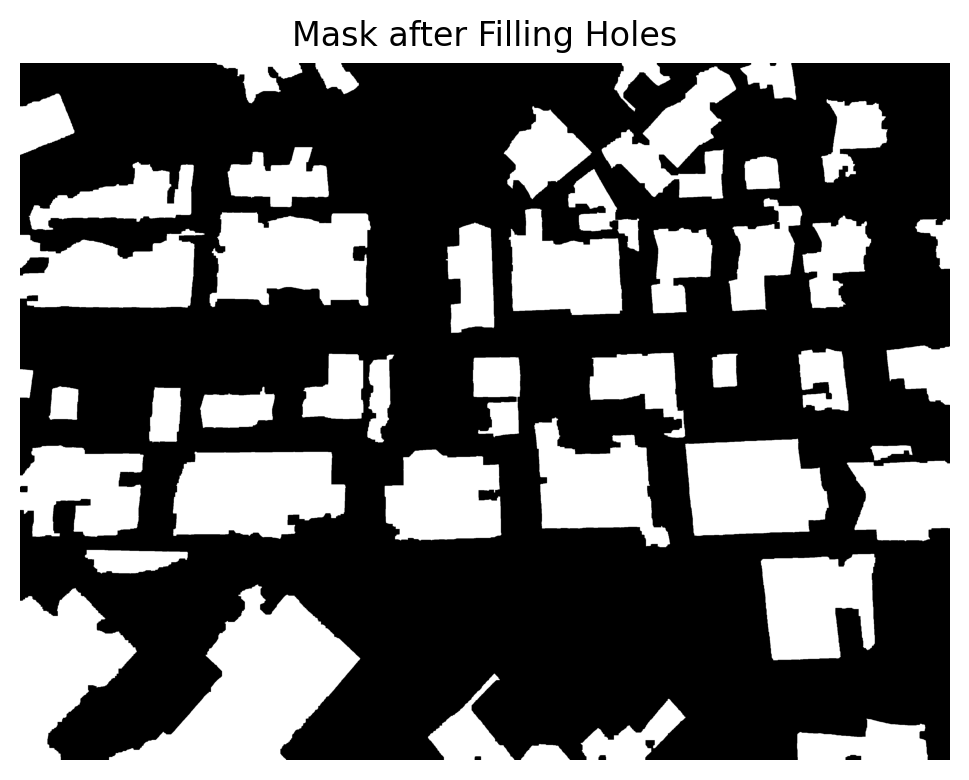

In [38]:
# fill holes again 
filled_mask_2 = binary_fill_holes(closed_mask).astype(np.uint8)

# Label and analyze properties of the closed mask
labeled_mask = label(filled_mask_2)
properties = regionprops(labeled_mask)

print(f"Count of objects: {len(properties)}")


# plot the filled mask
plt.figure(figsize=(6, 6))
plt.imshow(filled_mask_2, cmap='gray')
plt.title('Mask after Filling Holes')
plt.axis('off')
plt.show()

This is the final mask that we will use for further analysis. We can see that the rooftops are now clearly separated from the background, the final count of objects is 46.

# Labeling and Object Property Analysis
Labeling distinct segmented rooftops enables us to analyze and measure properties like area. This analysis provides insights into the size distribution of the rooftops, crucial for understanding the scale of buildings in the area.

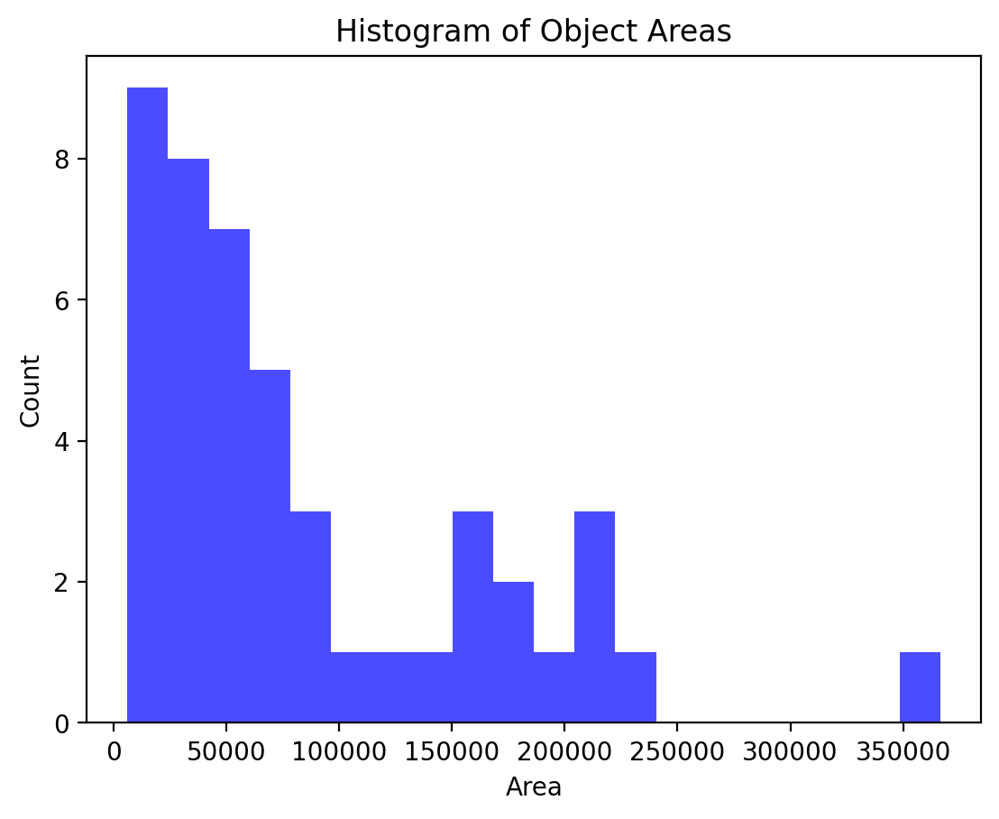

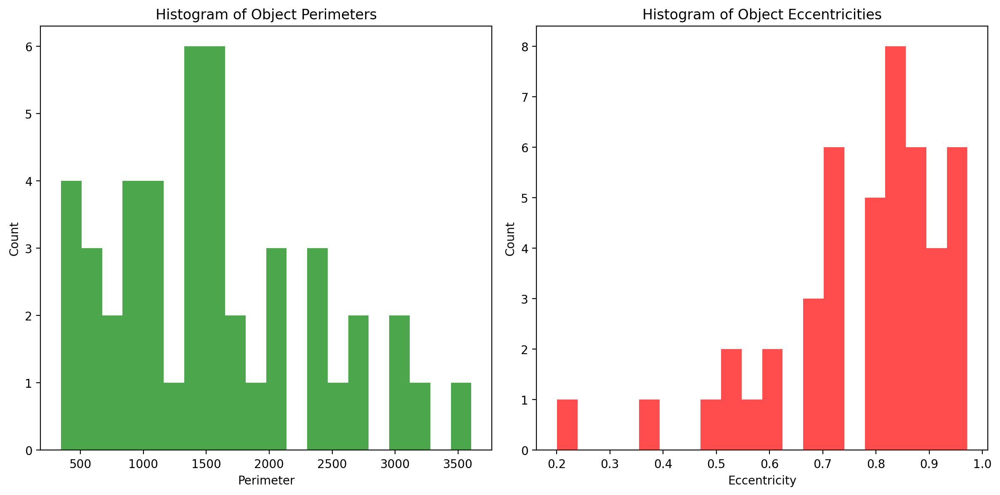

In [39]:
# Measure areas, perimeters, and eccentricities of the objects
areas = [prop.area for prop in properties]
perimeters = [prop.perimeter for prop in properties]
eccentricities = [prop.eccentricity for prop in properties]

# Histogram of areas
plt.figure()
plt.hist(areas, bins=20, color='blue', alpha=0.7)
plt.title('Histogram of Object Areas')
plt.xlabel('Area')
plt.ylabel('Count')
plt.show()


# Optional: Plot histograms for perimeters and eccentricities
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.hist(perimeters, bins=20, color='green', alpha=0.7)
plt.title('Histogram of Object Perimeters')
plt.xlabel('Perimeter')
plt.ylabel('Count')

plt.subplot(1, 2, 2)
plt.hist(eccentricities, bins=20, color='red', alpha=0.7)
plt.title('Histogram of Object Eccentricities')
plt.xlabel('Eccentricity')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

# Property Analysis and Utility

In this analysis, we have measured three properties of the segmented rooftops: area, perimeter, and eccentricity. Each of these properties has been chosen for their relevance in urban structure analysis and their ability to provide insights into the characteristics of the segmented objects:

- **Area**: The area of a rooftop is a fundamental property that reflects the size of the structure. The histogram of object areas shows a wide range of sizes, indicating a diverse set of buildings. Smaller areas are more frequent, suggesting many residential buildings, while the few larger areas may correspond to commercial or bigger mansion structures. This also aligns with image itself which seems to be a residential area with some commercial buildings. This distribution is useful for urban density studies and planning applications. 

- **Perimeter**: The perimeter provides a measure of the complexity of a rooftop's shape. The histogram displays a spread of perimeter values, with most rooftops having moderate to high complexity. This variety in perimeters can be indicative of different architectural styles or the presence of additional structures on the rooftops, such as HVAC units or terraces.

- **Eccentricity**: Eccentricity measures the elongation of an object; a value close to 1 indicates a shape that is nearly a line. The histogram of object eccentricities reveals that many rooftops are moderately to highly elongated, which could reflect the architectural design or potential segmentation issues that may have split larger rooftops into narrower segments. Understanding eccentricity is beneficial for identifying potential inaccuracies in segmentation and for architectural characterization.

These measurements provide a comprehensive overview of the physical properties of rooftops in the aerial image, which can inform further urban planning and development strategies. The variability in these properties highlights the complexity of analyzing satellite imagery and underscores the importance of accurate image processing techniques.


# Skeletonization for Minimal Representation
Skeletonization reduces a rooftop to its basic structure, minimizing the pixels used to represent it while preserving its shape and connectivity. This process is essential for shape analysis and feature extraction. It helps us understand the structural characteristics of the rooftops in a simplified form.

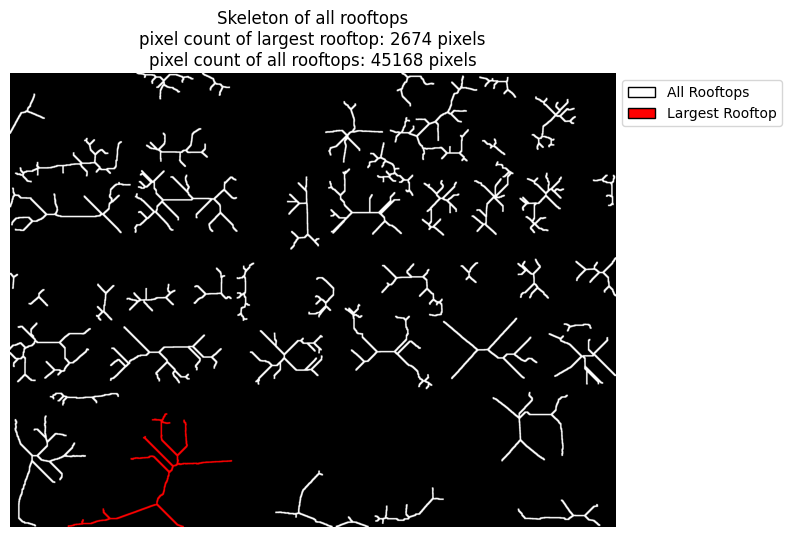

In [16]:
from matplotlib.patches import Patch

# Find the largest area index
largest_area_index = np.argmax(areas)

# Skeletonize the largest area
skeleton = skeletonize(labeled_mask == largest_area_index + 1)

# Skeletonize all areas
skeleton_all = skeletonize(labeled_mask > 0)

# Dilate the skeletons for visibility
thick_skeleton_all = dilation(skeleton_all, square(10))
thick_skeleton = dilation(skeleton, square(10))

plt.figure(figsize=(8, 6))
ax = plt.gca()

# Initialize a color image with the same dimensions, all black
color_image = np.zeros((thick_skeleton_all.shape[0], thick_skeleton_all.shape[1], 3), dtype=np.uint8)

# Assign the thick skeleton of all rooftops to white
color_image[thick_skeleton_all == 1] = [255, 255, 255]

# Overlay the largest rooftop in red
color_image[thick_skeleton == 1] = [255, 0, 0]

plt.imshow(color_image)

# Create a legend and position it outside the plot
legend_elements = [Patch(facecolor='white', edgecolor='black', label='All Rooftops'),
                   Patch(facecolor='red', edgecolor='black', label='Largest Rooftop')]
plt.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(1, 1))

plt.title(f'Skeleton of all rooftops\npixel count of largest rooftop: {np.sum(skeleton)} pixels\npixel count of all rooftops: {np.sum(skeleton_all)} pixels')
plt.axis('off')
plt.tight_layout()
plt.show()


In [40]:

# Overlay bounding boxes on the original image
overlay_with_bboxes = original_image.copy()
for prop in properties:
    minr, minc, maxr, maxc = prop.bbox
    cv2.rectangle(overlay_with_bboxes, (minc, minr), (maxc, maxr), (0, 255, 0), 3)

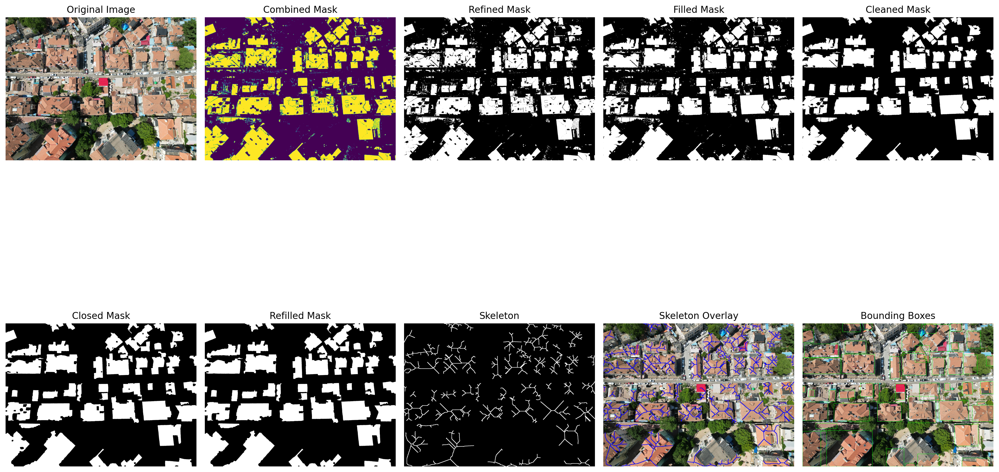

In [42]:
# Overlay the skeleton on the original image
skeleton_overlay = original_image.copy()


# change the color of the skeleton to blue to make it more visible
skeleton_overlay[thick_skeleton_all] = [0, 0, 255] 

# Plotting
titles = ['Original Image', 'Combined Mask', 'Refined Mask', 'Filled Mask',
          'Cleaned Mask', 'Closed Mask', 'Refilled Mask', 'All Skeletons', 'Skeleton Overlay', 'Bounding Boxes']
images = [original_image, combined_mask, refined_mask, filled_mask,
          cleaned_mask, closed_mask, filled_mask_2 , thick_skeleton_all, skeleton_overlay, overlay_with_bboxes]

plt.figure(figsize=(18, 14))
for i in range(len(titles)):
    plt.subplot(2, 5, i + 1)
    if titles[i] == 'Skeleton Overlay':
        plt.imshow(images[i])
    else:
        plt.imshow(images[i], cmap='gray' if i > 1 else None)
    plt.title(titles[i])
    plt.axis('off')
plt.tight_layout()
plt.show()

# fill holes again

This final plot showcases the full step by step process of our segmentation. We can see that the rooftops are now clearly separated from the background and that the segmentation is very accurate. The skeletonization also worked well and we can see that the largest rooftop is represented by a minimal number of pixels. The bounding boxes also show that the segmentation is very accurate and that the rooftops are clearly separated from each other.

## Final Conclusion
In this segmentation task, we effectively isolated rooftops from an aerial image using HSV color-based methods, refined by morphological operations. Opening smoothed boundaries, and closing with hole-filling preserved rooftop integrity. The methods minimized object alteration, ensuring shapes and sizes remained true to their original forms. We measured areas, perimeters, and eccentricities, yielding valuable data on building dimensions and styles. However, the segmentation faced challenges: one street was erroneously included due to its color similarity to rooftops, and two roofs with greyish solar installations were not cleanly segmented, highlighting the method's sensitivity to color variations. Incorporating grey shades would have confounded the segmentation, as streets share similar hues (I really tried...). The skeletonization of a rooftop provided a minimal structural representation. Despite these limitations, the analysis offers significant insights for urban planning, though it underscores the need for more nuanced color differentiation in segmentation processes. 

# 2. feature descriptors in images (LE4)


## 2.1. keypoint matching

Select a few images with the same subject/object that show the object from different angles, from a different perspective, from a different distance or rotated. Then apply the keypoint descriptor {'SIFT'} assigned to you to "match" at least two of your images via keypoints. Choose suitable parameters and a suitable number of keypoints. Explain your decisions in 1-2 sentences. Show your results visually and make 2-3 observations.
Discuss in approx. 150 words how robust the algorithm {'SIFT'} assigned to you is with regard to transformations or different recording conditions (light, ...) and its computational efficiency. Show at least one of these properties using your example data. Discuss the results and findings in 2-3 sentences.

Please note: this is an open task. Set yourself a framework for the limitation or come to the consultation if the limits are not clear to you. Apt choice of data, to-the-point creativity, moderate diversity and critical thinking are required.


## SIFT (Scale-Invariant Feature Transform)

### What is SIFT?
Scale-Invariant Feature Transform (SIFT) is a widely used algorithm in computer vision for detecting and describing local features in images. Developed by David Lowe in 2004, SIFT is particularly celebrated for its ability to identify distinctive features (or keypoints) in images that are invariant to scaling, rotation, and partially invariant to changes in illumination and 3D camera viewpoint.

### How SIFT Works
SIFT operates in several key stages (general idea):

1. **Scale-Space Extrema Detection**: SIFT starts by searching for extrema (maximum and minimum) points in the scale space (a series of images scaled differently). It uses the Difference of Gaussians (DoG) approach which involves the subtraction of two blurred images at different scales.

2. **Keypoint Localization**: Potential keypoints are refined to get more accurate results. This step removes low-contrast keypoints and edges, enhancing the stability of these points.

3. **Orientation Assignment**: Each keypoint is assigned one or more orientations based on local image gradient directions. This step ensures that the keypoint descriptor is rotation invariant.

4. **Keypoint Descriptor**: The local gradient data around each keypoint (in its scale space) is transformed into a descriptor. The descriptor is highly distinctive and partially invariant to the remaining variations, such as lighting or 3D viewpoint.

5. **Keypoint Matching**: In the final stage, keypoints between different images are matched by comparing their descriptors using some distance measure (like Euclidean distance)

### Capabilities of SIFT
- **Robustness**: SIFT features are robust to changes in image scale, noise, illumination, and rotation.
- **Distinctiveness**: The descriptors provide a unique fingerprint to match different instances of the same object across many images.
- **Wide Applications**: SIFT can be used in various applications like object recognition, robotic mapping and navigation, 3D modeling, gesture recognition, and video tracking.

### Limitations
While SIFT is a powerful tool, it has some limitations. It can be computationally intensive, especially for high-resolution images, and may not perform well in conditions of extreme blurring or occlusion. Despite these, SIFT remains a foundational technique in the field of computer vision.



## Data Description: Warframe Images of Mirage Prime

The dataset for this exercise comprises a series of high-quality images of Mirage Prime, a character from the popular video game Warframe. These images were personally created using the game's Captura Mode, a feature that allows players to capture cinematic in-game photographs. This mode provides the flexibility to experiment with various lighting conditions, camera angles, and compositions, making it an ideal tool for generating a diverse set of images.

More info: 
- https://www.warframe.com/
- https://warframe.fandom.com/wiki/Mirage/Prime
- https://warframe.fandom.com/wiki/Captura

Each image captures detailed aspects of Mirage Prime's appearance, with a particular focus on facial features. The high resolution of these images ensures that even minute details are preserved, which is crucial for effective feature detection and matching. The varied conditions under which these images were taken - differing lighting, angles, and perspectives - present a challenging yet perfect playground for testing the robustness and efficiency of keypoint matching algorithms like SIFT.


In [74]:
# plot the images


## Grid Search in Keypoint Matching

### Overview
The grid search implemented in the `KeypointMatcher` class is a systematic approach to optimize the parameters used in the SIFT algorithm for keypoint detection and matching. It iterates over a predefined range of parameter values, assessing the effectiveness of each combination in matching keypoints between a main image and a set of comparison images.

### How It Works
1. **Parameter Combinations**: The method explores combinations of SIFT parameters like `nfeatures`, `contrastThreshold`, and `edgeThreshold`.
2. **Performance Evaluation**: For each parameter set, it computes a performance score based on the number and quality of keypoint matches. This score is the number of matches divided by their average distance, promoting a balance between match quantity and quality.
3. **Aggregated Scoring**: The average performance score across all image comparisons is calculated, giving a holistic view of each parameter set's effectiveness.

### Justification of the Approach
- **Automated Optimization**: Manual tuning of parameters is often time-consuming and may not yield the best results due to the subjective nature of visual inspection. Grid search, on the other hand, provides an automated, objective, and comprehensive exploration of the parameter space.
- **Balanced Metrics**: By considering both the number of matches and the average distance (quality) of these matches, the grid search ensures a balanced assessment of each parameter set. This is crucial for achieving reliable and high-quality keypoint matching.
- **Efficiency**: Grid search streamlines the process of parameter tuning, making it more efficient and reproducible. It reduces the need for trial-and-error and allows for a more systematic approach to parameter optimization.

### Conclusion
The grid search method offers a more efficient and objective way to find the optimal SIFT parameters for keypoint matching. It outperforms manual checking by providing a balanced and comprehensive evaluation of each parameter set, ensuring both the quantity and quality of matches are considered.


In [1]:
import itertools
import time

class KeypointMatcher:

    def __init__(self, sift_params=None):
        default_params = {'nfeatures': 500, 'contrastThreshold': 0.04, 'edgeThreshold': 10}
        if sift_params is not None:
            default_params.update(sift_params)
        self.sift = cv2.SIFT_create(**default_params)

    def load_image(self, file_path):
        color_image = cv2.imread(file_path, cv2.IMREAD_COLOR)
        if color_image is None:
            raise FileNotFoundError(f"Image file {file_path} not found.")
        gray_image = cv2.cvtColor(color_image, cv2.COLOR_BGR2GRAY)
        return color_image, gray_image

    def detect_and_compute(self, gray_image):
        keypoints, descriptors = self.sift.detectAndCompute(gray_image, None)
        return keypoints, descriptors

    def match_keypoints(self, descriptors1, descriptors2, ratio_test=0.75):
        bf = cv2.BFMatcher(normType=cv2.NORM_L2, crossCheck=False)
        matches = bf.knnMatch(descriptors1, descriptors2, k=2)
        good_matches = [m for m, n in matches if m.distance < ratio_test * n.distance]
        # Sort and select top 10 matches
        return sorted(good_matches, key=lambda x: x.distance)[:10]

    def draw_matches(self, img1_color, kp1, img2_color, kp2, matches):
        matched_image = cv2.drawMatches(img1_color, kp1, img2_color, kp2, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
        matched_image = cv2.cvtColor(matched_image, cv2.COLOR_BGR2RGB)
        return matched_image

    def visualize_keypoints(self, color_image, keypoints):
        # Increase keypoint size for visibility
        keypoint_image = cv2.drawKeypoints(color_image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color=(0, 255, 0))
        keypoint_image = cv2.cvtColor(keypoint_image, cv2.COLOR_BGR2RGB)
        return keypoint_image

    def match_and_visualize(self, main_image_path, other_image_paths, ratio_test=0.75):
        main_color, main_gray = self.load_image(main_image_path)
        kp_main, des_main = self.detect_and_compute(main_gray)

        for path in other_image_paths:
            img_color, img_gray = self.load_image(path)
            kp_img, des_img = self.detect_and_compute(img_gray)

            matches = self.match_keypoints(des_main, des_img, ratio_test)
            matched_image = self.draw_matches(main_color, kp_main, img_color, kp_img, matches)

            plt.figure(figsize=(12, 6))
            plt.imshow(matched_image)
            plt.axis('off')
            plt.title(f'Matched Keypoints with {path}')
            plt.show()

    def grid_search(self, param_grid, main_image_path, other_image_paths, ratio_test=0.75):
        param_combinations = [dict(zip(param_grid, v)) for v in itertools.product(*param_grid.values())]
        grid_search_results = []
        for params in param_combinations:
            self.sift = cv2.SIFT_create(**params)
            _, main_img = self.load_image(main_image_path)
            kp_main, des_main = self.detect_and_compute(main_img)
            for path in other_image_paths:
                _, img = self.load_image(path)
                kp_img, des_img = self.detect_and_compute(img)
                matches = self.match_keypoints(des_main, des_img, ratio_test)
                match_confidence = sum([m.distance for m in matches])
                performance_score = len(matches) / match_confidence if matches else 0
                grid_search_results.append({'params': params, 'num_matches': len(matches), 'match_confidence': match_confidence, 'performance_score': performance_score})
        return grid_search_results

    def grid_search2(self, param_grid, main_image_path, other_image_paths, ratio_test=0.75):
        param_combinations = [dict(zip(param_grid, v)) for v in itertools.product(*param_grid.values())]
        grid_search_results = []
        for params in param_combinations:
            self.sift = cv2.SIFT_create(**params)
            main_color, main_gray = self.load_image(main_image_path)
            kp_main, des_main = self.detect_and_compute(main_gray)

            total_performance_score = 0
            for path in other_image_paths:
                img_color, img_gray = self.load_image(path)
                kp_img, des_img = self.detect_and_compute(img_gray)
                matches = self.match_keypoints(des_main, des_img, ratio_test)

                # Calculate the performance score
                if matches:
                    match_distances = [m.distance for m in matches]
                    average_distance = sum(match_distances) / len(match_distances)
                    performance_score = len(matches) / average_distance  # Higher score is better
                else:
                    performance_score = 0

                total_performance_score += performance_score

            # Average performance score across all image comparisons
            average_performance_score = total_performance_score / len(other_image_paths)
            grid_search_results.append({'params': params, 'average_performance_score': average_performance_score})

        # Selecting the parameter set with the highest average performance score
        best_params = max(grid_search_results, key=lambda x: x['average_performance_score'])['params']
        return best_params

    def optimized_matching(self, main_image_path, other_image_paths, param_grid):
        best_params = max(self.grid_search(param_grid, main_image_path, other_image_paths), key=lambda x: x['performance_score'])['params']
        self.sift = cv2.SIFT_create(**best_params)
        self.match_and_visualize(main_image_path, other_image_paths)

    def measure_efficiency(self, main_image_path, other_image_paths):
        start_time = time.time()
        self.match_and_visualize(main_image_path, other_image_paths)
        return time.time() - start_time


## Tests

### 1. Lighting Variation Test
- **Objective**: Assess SIFT's robustness to changes in illumination.
- **Setup**: Compare the main image with good lighting against an image with significantly altered lighting (dimmer/brighter).
- **Expected Outcome**: Successful keypoint matching despite lighting variations.

### 2. Rotation and Scale Test
- **Objective**: Test SIFT's scale and rotation invariance.
- **Setup**: Use an image with Mirage Prime rotated (e.g., 45 or 90 degrees) and another with a noticeable change in scale (closer/farther).
- **Expected Outcome**: Effective identification and matching of keypoints between main image and rotated/scaled images.

### 3. Perspective and Angulation Test
- **Objective**: Evaluate SIFT's performance under different camera perspectives and angles.
- **Setup**: Select an image with a drastically different camera angle (e.g., top-down or low-angle shot) compared to the main image.
- **Expected Outcome**: Consistent keypoint location and matching despite perspective changes.

### 4. Partial Occlusion Test
- **Objective**: Understand SIFT's handling of occlusions.
- **Setup**: Use an image where parts of Mirage Prime are obscured by in-game elements.
- **Expected Outcome**: Keypoint matching on visible parts, although total matches may be reduced.

### 5. Background and Environment Complexity Test
- **Objective**: Determine SIFT's effectiveness against complex backgrounds.
- **Setup**: Compare the main image (simple background) with an image of Mirage Prime against a complex background.
- **Expected Outcome**: Keypoints focused on the character, minimally influenced by background complexity.


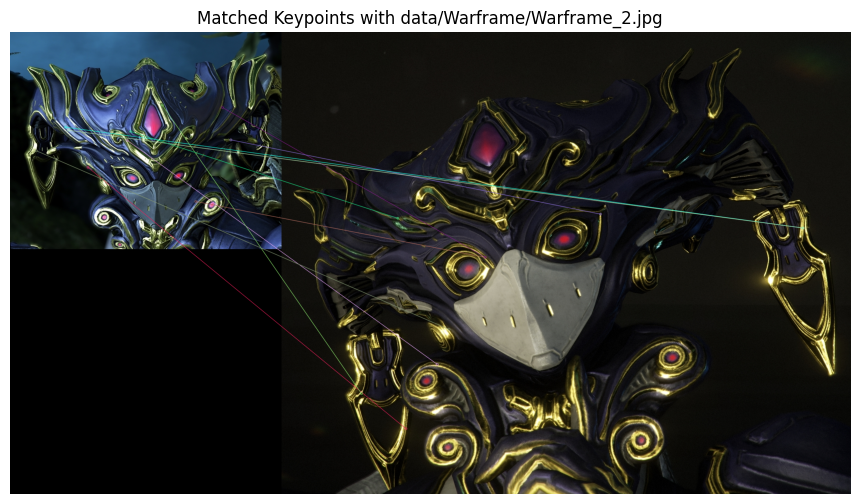

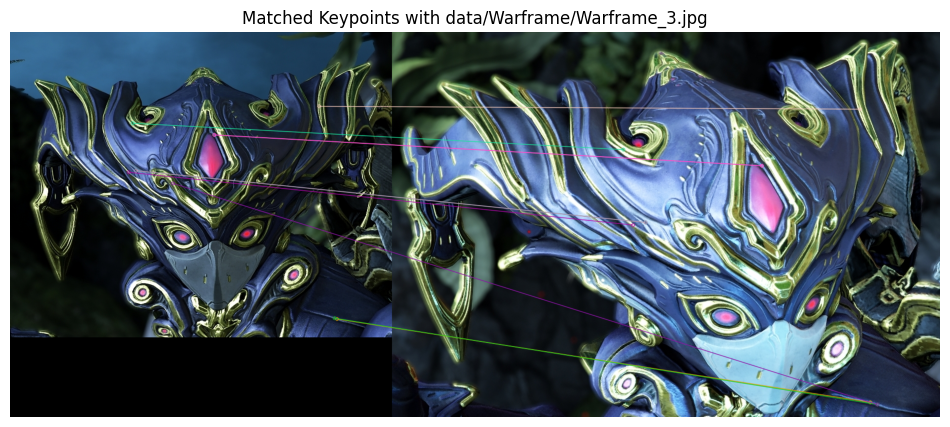

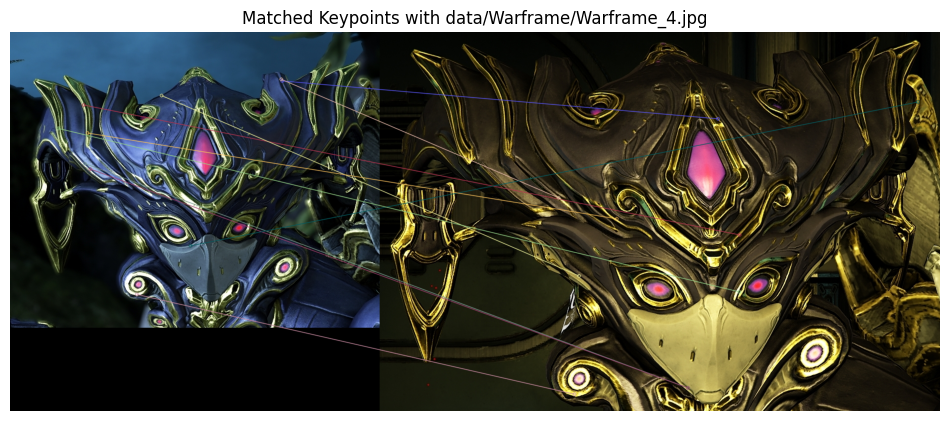

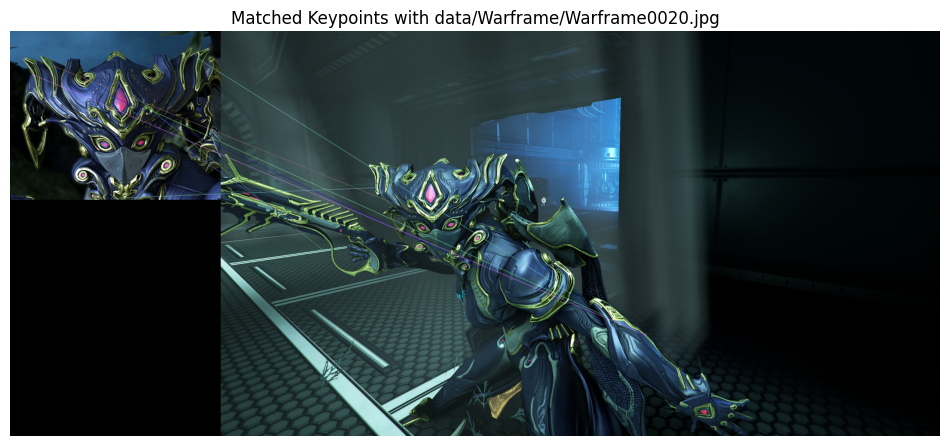

In [2]:
import cv2
import matplotlib.pyplot as plt
import itertools
import time

# Define the main image and other images
main_image_path = 'data/Warframe/Warframe_main.jpg'
other_image_paths = [
    'data/Warframe/Warframe_2.jpg',
    'data/Warframe/Warframe_3.jpg',
    'data/Warframe/Warframe_4.jpg',
    'data/Warframe/Warframe0020.jpg',
]

# Define the parameter grid for the grid search
param_grid = {
    'nfeatures': [100, 300, 500, 1000, 2000],
    'contrastThreshold': [0.03, 0.04, 0.05],
    'edgeThreshold': [8, 10, 12]
}

# Initialize the KeypointMatcher
matcher = KeypointMatcher()

# Run the optimizer on the specified images
matcher.optimized_matching(main_image_path, other_image_paths, param_grid)


In [ ]:
# fixme explain what SIFT SHOULD achieve,and what I was able to achieve